In [18]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchaudio
import torchaudio.transforms as T
import torch.optim as optim
import torch
import os
from torch.utils.data import Dataset, DataLoader
from collections import OrderedDict
import psutil  # For monitoring memory usage
from torch.nn.functional import cosine_similarity
import random
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sys
from tqdm import tqdm

sys.path.append('unet')
from unet import Unet
print("Switched back to:", os.getcwd())

from transformers import SpeechT5HifiGan, SpeechT5Processor

Switched back to: C:\Users\James Lee\Desktop\Course\MachineLearningMusic\project


In [2]:
# Ensure device is set
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the processor and model
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base")
model = Wav2Vec2Model.from_pretrained("facebook/wav2vec2-base").to(device)

C:\Users\James Lee\AppData\Roaming\Python\Python312\site-packages\transformers\configuration_utils.py:364: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(
C:\Users\James Lee\AppData\Roaming\Python\Python312\site-packages\transformers\tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Some weights of Wav2Vec2Model were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parame

In [3]:
def load_and_preprocess_audio(filepath, target_sample_rate=16000, max_length=16000):
    """
    Load and preprocess the audio file.
    Args:
        filepath (str): Path to the .wav file.
        target_sample_rate (int): Target sample rate for the audio.
        max_length (int): Maximum length of the audio in samples.
    
    Returns:
        torch.Tensor: Preprocessed audio tensor of shape (1, max_length).
    """
    # Load audio
    waveform, sample_rate = torchaudio.load(filepath)

    # Resample if needed
    if sample_rate != target_sample_rate:
        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=target_sample_rate)
        waveform = resampler(waveform)

    # Convert to mono if stereo
    if waveform.shape[0] > 1:
        waveform = waveform.mean(dim=0, keepdim=True)

    # Pad or truncate to max_length
    if waveform.shape[1] < max_length:
        padding = max_length - waveform.shape[1]
        waveform = torch.nn.functional.pad(waveform, (0, padding))
    else:
        waveform = waveform[:, :max_length]

    # Normalize
    waveform = (waveform - waveform.mean()) / (waveform.std() + 1e-9)

    return waveform

In [4]:
def parse_wav_files(base_dir):
    """
    Parse all .wav files and organize them into a dictionary.

    Args:
        base_dir (str): The base directory containing singers' folders.

    Returns:
        dict: A dictionary with keys as "{song_name + technique}" and values as "{singer, technique, file_path (list)}".
    """
    singers_data = {
        "ZH-Alto-1": "Singer_Alto",
        "ZH-Tenor-1": "Singer_Tenor"
    }

    wav_dict = {}

    for singer_folder, singer_name in singers_data.items():
        singer_path = os.path.join(base_dir, "Chinese", singer_folder)

        # Traverse through techniques
        for technique in os.listdir(singer_path):
            technique_path = os.path.join(singer_path, technique)

            if not os.path.isdir(technique_path):
                continue

            # Traverse through song names
            for song_name in os.listdir(technique_path):
                song_path = os.path.join(technique_path, song_name)

                if not os.path.isdir(song_path):
                    continue

                # Traverse through groups
                for group in os.listdir(song_path):
                    group_path = os.path.join(song_path, group)

                    if not os.path.isdir(group_path):
                        continue

                    # Traverse .wav files in the group
                    for file_name in os.listdir(group_path):
                        if file_name.endswith(".wav"):
                            file_path = os.path.join(group_path, file_name)
                            key = f"{song_name}_{technique}"
                            
                            # Add to dictionary
                            if key not in wav_dict:
                                wav_dict[key] = {
                                    "singer": singer_name,
                                    "technique": technique,
                                    "file_path": []
                                }
                            
                            # Append file path to the list
                            wav_dict[key]["file_path"].append(file_path)

    return wav_dict

#################
base_directory = "."  # Replace with the actual path
wav_dict = parse_wav_files(base_directory)

# Remove file paths with "Paired_Speech_Group"
for key, value in wav_dict.items():
    value['file_path'] = [
        path for path in value['file_path']
        if "Paired_Speech_Group" not in path
    ]

# Display the results
for key, value in wav_dict.items():
    print(f"Key: {key}")
    print(f"Value: {value}")
#################

Key: 不再见_Breathy
Value: {'singer': 'Singer_Alto', 'technique': 'Breathy', 'file_path': ['.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0000.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0001.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0002.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0003.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0004.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0005.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0006.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0007.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0008.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0009.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0010.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Breathy_Group\\0011.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Control_Group\\0000.wav', '.\\Chinese\\ZH-Alto-1\\Breathy\\不再见\\Control_Group\\0001.wav', '.\\Chinese\\ZH-

In [5]:
import numpy as np

# List of techniques
techniques = ["Breathy", "Glissando", "Mixed Voice and Falsetto", "Pharyngeal", "Vibrato"]

# One-hot encoding mapping
technique_to_onehot = {tech: np.eye(len(techniques))[i].tolist() for i, tech in enumerate(techniques)}

# Example usage
print(technique_to_onehot["Breathy"])  # Output: [1, 0, 0, 0, 0]

[1.0, 0.0, 0.0, 0.0, 0.0]


.\Chinese\ZH-Alto-1\Breathy\不再见\Breathy_Group\0000.wav


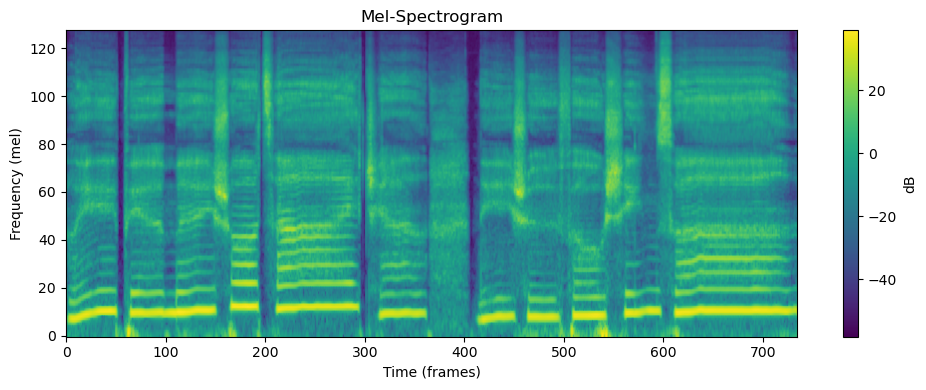

tensor([[[ -9.8388,  -3.0657,   4.5154,  ...,   5.6904,   4.7631,   2.3726],
         [-11.2099,  -2.9139,   2.0452,  ...,   1.2770,   3.3172,  -2.9538],
         [ -9.4377,  -6.4315,  -2.4894,  ...,  -3.9409,   0.1801,  -4.8298],
         ...,
         [-53.6342, -51.7004, -50.9870,  ..., -41.6517, -40.9951, -44.4522],
         [-50.3397, -51.7314, -51.3956,  ..., -45.9276, -45.1013, -46.1053],
         [-51.2070, -50.9720, -48.6346,  ..., -43.7375, -45.2237, -42.9354]]])


In [6]:
def compute_mel_spectrogram(
    audio_path,
    sample_rate=48000,
    n_fft=2048,
    hop_length=512,
    n_mels=128,
    to_db=True,
    show_plot=False
):
    """
    Compute the mel-spectrogram of an audio file.
    
    Parameters:
        audio_path (str): Path to the audio file.
        sample_rate (int): Desired sample rate of the audio.
        n_fft (int): Number of FFT points.
        hop_length (int): Number of samples between successive frames.
        n_mels (int): Number of mel filter banks.
        to_db (bool): Whether to convert the spectrogram to decibel scale.
    
    Returns:
        torch.Tensor: Mel-spectrogram (in dB if to_db is True).
    """
    # Load audio file
    waveform, orig_sample_rate = torchaudio.load(audio_path)
    
    # Resample if necessary
    if orig_sample_rate != sample_rate:
        resampler = T.Resample(orig_freq=orig_sample_rate, new_freq=sample_rate)
        waveform = resampler(waveform)
    
    # Create MelSpectrogram transform
    mel_spectrogram = T.MelSpectrogram(
        sample_rate=sample_rate,
        n_fft=n_fft,
        hop_length=hop_length,
        n_mels=n_mels
    )
    
    # Compute the mel-spectrogram
    mel_spec = mel_spectrogram(waveform)
    
    # Convert to dB if required
    if to_db:
        db_transform = T.AmplitudeToDB(stype='power')
        mel_spec = db_transform(mel_spec)
        
    # Visualize the mel-spectrogram
    if show_plot:
        plt.figure(figsize=(10, 4))
        plt.imshow(mel_spec[0].numpy(), aspect='auto', origin='lower', cmap='viridis')
        plt.colorbar(label='dB')
        plt.title('Mel-Spectrogram')
        plt.xlabel('Time (frames)')
        plt.ylabel('Frequency (mel)')
        plt.tight_layout()
        plt.show()
    
    return mel_spec

temp_filepath = wav_dict['不再见_Breathy']['file_path'][0]
print(temp_filepath)
mel_spec = compute_mel_spectrogram(temp_filepath, show_plot=True)
print(mel_spec)

In [7]:
def compute_global_min_max(data_dict, sample_rate=48000):
    """
    Computes the global minimum and maximum of mel-spectrograms for all files in the dictionary.

    Args:
        data_dict (dict): Dictionary containing file paths for all techniques.
        sample_rate (int): Sample rate for loading audio.

    Returns:
        tuple: (mel_min, mel_max) across all mel-spectrograms.
    """
    global_min = float('inf')
    global_max = float('-inf')
    
    counter = 0

    for key, value in data_dict.items():
        file_paths = value["file_path"]

        for file_path in file_paths:
            
            if counter % 250 == 0:
                print(counter)
            
            # Compute mel-spectrogram for each file
            mel_spectrogram = compute_mel_spectrogram(file_path, sample_rate=sample_rate)

            # Update global min and max
            file_min = mel_spectrogram.min().item()
            file_max = mel_spectrogram.max().item()

            global_min = min(global_min, file_min)
            global_max = max(global_max, file_max)

            # Debugging/logging
            counter = counter + 1
            # print(f"[DEBUG] File: {file_path}, Min: {file_min}, Max: {file_max}")

    return global_min, global_max

# Compute global min and max
global_mel_min, global_mel_max = compute_global_min_max(wav_dict)
print(f"Global Mel-Spectrogram Min: {global_mel_min}, Max: {global_mel_max}")

0
250
500
750
1000
1250
1500
1750
2000
2250
2500
2750
3000
3250
3500
3750
4000
4250
4500
4750
5000
5250
5500
5750
6000
6250
6500
6750
7000
Global Mel-Spectrogram Min: -100.0, Max: 55.233909606933594


In [11]:
def normalize_mel(mel, global_mel_min, global_mel_max):
    """
    Normalize the mel-spectrogram to range [0, 1].
    Args:
        mel (np.ndarray or torch.Tensor): Input mel-spectrogram.
    Returns:
        torch.Tensor: Normalized mel-spectrogram.
    """
    return (mel - global_mel_min) / (global_mel_max - global_mel_min + 1e-8)

In [12]:
# total 4080

class VocalTechniqueDataset(Dataset):
    def __init__(self, data_dict, sample_rate=48000, fixed_timesteps=196, step_size=10, transform=None):
        """
        Initializes the dataset.

        Args:
            data_dict (dict): Dictionary containing file paths for all techniques.
            sample_rate (int): Sample rate for loading audio.
            fixed_timesteps (int): Fixed number of timesteps for all samples.
            step_size (int): Step size for sequential sampling.
            transform (callable, optional): Transformation to apply to audio.
        """
        self.data_pairs = []
        self.sample_rate = sample_rate
        self.fixed_timesteps = fixed_timesteps
        self.step_size = step_size
        self.transform = transform

        # Map techniques to one-hot encodings
        techniques = ["Breathy", "Glissando", "Mixed_Voice_and_Falsetto", "Pharyngeal", "Vibrato"]
        self.technique_to_onehot = {tech: np.eye(len(techniques))[i].tolist() for i, tech in enumerate(techniques)}

        # Pair files by matching filenames and calculate global min/max
        for key, value in data_dict.items():
            control_files = [path for path in value["file_path"] if "Control_Group" in path]
            technique_files = [path for path in value["file_path"] if "Group" in path and "Control_Group" not in path]

            control_files_map = {os.path.basename(f): f for f in control_files}
            for technique_path in technique_files:
                filename = os.path.basename(technique_path)
                if filename in control_files_map:
                    # Pair with technique label
                    pair = (control_files_map[filename], technique_path, value["technique"])
                    self.data_pairs.append(pair)
                
                    # print(f"paired{pair[0]} -> {pair[1]}")
                    
                    

    def __len__(self):
        return len(self.data_pairs)

    def sample_fixed_window(self, mel_spec):
        """
        Adjusts the timesteps of the mel-spectrogram to 400:
        - If timesteps < 400, pads with zeros to 400.
        - If timesteps > 400, truncates to 400 and pads remaining slots with zeros.

        Args:
            mel_spec (torch.Tensor): Mel-spectrogram of shape [n_mels, timesteps].

        Returns:
            torch.Tensor: Mel-spectrogram adjusted to have 400 timesteps.
        """
        n_mels, timesteps = mel_spec.shape
        target_timesteps = 400

        if timesteps < target_timesteps:
            # Pad with zeros to make timesteps = 400
            padding = target_timesteps - timesteps
            mel_spec = torch.nn.functional.pad(mel_spec, (0, padding))
        elif timesteps > target_timesteps:
            # Truncate to the first 400 timesteps
            mel_spec = mel_spec[:, :target_timesteps]
            # Pad with zeros to maintain consistent shape
            padding = target_timesteps - mel_spec.shape[1]
            mel_spec = torch.nn.functional.pad(mel_spec, (0, padding))

        return mel_spec

    def __getitem__(self, idx):
        # Retrieve paths and technique from the data_pairs
        control_path, technique_path, technique = self.data_pairs[idx]

        # Compute mel-spectrograms
        control_mel = compute_mel_spectrogram(control_path, sample_rate=self.sample_rate)
        technique_mel = compute_mel_spectrogram(technique_path, sample_rate=self.sample_rate)

        # Remove the extra batch dimension if present
        control_mel = control_mel.squeeze(0)  # Shape becomes [n_mels, timesteps]
        technique_mel = technique_mel.squeeze(0)  # Shape becomes [n_mels, timesteps]
        
        # Normalize mel-spectrograms
        control_mel = normalize_mel(control_mel, global_mel_min, global_mel_max)
        technique_mel = normalize_mel(technique_mel, global_mel_min, global_mel_max)

        # Use sample_fixed_window to adjust timesteps to the target size
        control_mel = self.sample_fixed_window(control_mel)  # Returns a list of windows
        technique_mel = self.sample_fixed_window(technique_mel)  # Returns a list of windows

        # Add a channel dimension
        control_mel = control_mel.unsqueeze(1)  # Shape becomes [num_windows, 1, n_mels, fixed_timesteps]
        technique_mel = technique_mel.unsqueeze(1)  # Shape becomes [num_windows, 1, n_mels, fixed_timesteps]

        # Get one-hot encoding for the technique
        technique_onehot = self.technique_to_onehot[technique]
        technique_onehot = torch.tensor(technique_onehot, dtype=torch.float32)

        # Return a dictionary
        return {
            "control_mel": control_mel,
            "technique_mel": technique_mel,
            "technique_onehot": technique_onehot
        }
    


# Create dataset
dataset = VocalTechniqueDataset(wav_dict)

In [13]:
# Create the dataset and dataloader
dataset = VocalTechniqueDataset(wav_dict)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

counter = 0
for batch in dataloader:
    
    if counter == 10:
        break
    
    inputs = batch["control_mel"]
    targets = batch["technique_mel"]
    technique_embeddings = batch["technique_onehot"]
    
    print(f"Inputs type: {type(inputs)}, shape: {inputs.shape}")
    print(f"Targets type: {type(targets)}, shape: {targets.shape}")
    print(f"Technique Embeddings type: {type(technique_embeddings)}, shape: {technique_embeddings.shape}, value: {technique_embeddings}")
    
    counter = counter + 1

Inputs type: <class 'torch.Tensor'>, shape: torch.Size([16, 128, 1, 400])
Targets type: <class 'torch.Tensor'>, shape: torch.Size([16, 128, 1, 400])
Technique Embeddings type: <class 'torch.Tensor'>, shape: torch.Size([16, 5]), value: tensor([[0., 0., 1., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 1.],
        [0., 0., 1., 0., 0.],
        [1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 1., 0., 0.],
        [1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 0., 1., 0.],
        [1., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 1., 0., 0.],
        [0., 0., 0., 1., 0.]])
Inputs type: <class 'torch.Tensor'>, shape: torch.Size([16, 128, 1, 400])
Targets type: <class 'torch.Tensor'>, shape: torch.Size([16, 128, 1, 400])
Technique Embeddings type: <class 'torch.Tensor'>, shape: torch.Size([16, 5]), value: tensor([[0., 0., 0., 0., 1.],
        [0., 1., 0.

In [14]:
# Initialize the U-Net model
model = Unet(input_channels=256, embedding_dim=5)
model = model.to("cuda")  # Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [15]:
def train_unet(model, dataloader, num_epochs, device, save_path, learning_rate=1e-4):
    """
    Train a U-Net model.

    Args:
        model (nn.Module): The U-Net model to train.
        dataloader (DataLoader): The DataLoader for training data.
        num_epochs (int): Number of training epochs.
        device (torch.device): Device to run training on (CPU or GPU).
        save_path (str): Path to save the trained model.
        learning_rate (float): Learning rate for the optimizer.

    Returns:
        None
    """
    criterion = nn.MSELoss()  # Compare output and target mel-spectrograms
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    best_loss = float("inf")  # Track the best loss

    for epoch in range(num_epochs):
        print(f"Epoch {epoch + 1}/{num_epochs}")
        model.train()
        running_loss = 0.0

        # Wrap the DataLoader in tqdm for a progress bar
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch + 1}/{num_epochs}", leave=True)

        for batch_idx, batch in enumerate(progress_bar):
            inputs = batch["control_mel"].to(device)
            targets = batch["technique_mel"].to(device)
            technique_embeddings = batch["technique_onehot"].to(device)

            # Forward pass
            outputs = model(inputs, technique_embeddings)
            loss = criterion(outputs, targets)

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Update running loss
            running_loss += loss.item()

            # Update progress bar with batch loss
            progress_bar.set_postfix({"Batch Loss": loss.item()})

        # Calculate epoch loss
        epoch_loss = running_loss / len(dataloader)
        print(f"Epoch {epoch + 1}, Average Loss: {epoch_loss:.4f}")

        # Save the model if it's the best so far
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            torch.save(model.state_dict(), save_path)
            print(f"New best model saved to {save_path}")

    print("Training complete!")
    
train_unet(
    model=model,
    dataloader=dataloader,
    num_epochs=1,
    device=device,
    save_path="unet_model.pth",
    learning_rate=1e-4
)

Epoch 1/1


Epoch 1/1: 100%|██████████████████████████████████████████████████| 255/255 [01:59<00:00,  2.13it/s, Batch Loss=0.00738]

Epoch 1, Average Loss: 0.0983
New best model saved to unet_model.pth
Training complete!


In [16]:
def denormalize_mel(normalized_mel, global_min, global_max):
    """
    Reverse the normalization of a mel-spectrogram.

    Args:
        normalized_mel (torch.Tensor): Normalized mel-spectrogram tensor.
        global_min (float): Global minimum value used for normalization.
        global_max (float): Global maximum value used for normalization.

    Returns:
        torch.Tensor: Original mel-spectrogram tensor.
    """
    # Reverse normalization
    original_mel = normalized_mel * (global_max - global_min) + global_min
    return original_mel

In [20]:
model.eval()  # Set the model to evaluation mode

data = dataset[0]  # Replace with the desired sample index
control_mel = data["control_mel"].unsqueeze(0).to(device)  # Add batch dimension
technique_onehot = data["technique_onehot"].unsqueeze(0).to(device)  # Add batch dimension

model_output = None

# Run inference
with torch.no_grad():  # Disable gradient computation for inference
    output = model(control_mel, technique_onehot)
    output = denormalize_mel(output, global_mel_min, global_mel_max)
    print(output)
    model_output = output
    

tensor([[[[-33.3740, -20.9864, -14.3857,  ..., -11.2729, -30.4330, -59.3104]],

         [[-53.7784, -29.0491, -19.8007,  ..., -12.7933, -25.8170, -51.3110]],

         [[-44.2876, -33.8151, -24.0904,  ..., -16.7456, -28.6475, -52.4601]],

         ...,

         [[-83.5938, -64.1966, -54.4774,  ..., -47.6262, -52.6561, -62.2857]],

         [[-47.9146, -45.4905, -43.8705,  ..., -43.7431, -57.3805, -81.3891]],

         [[-62.6692, -55.4041, -49.3386,  ..., -46.4102, -51.9657, -66.5289]]]],
       device='cuda:0')


In [37]:
# Load the HiFi-GAN vocoder
hifigan = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan").to(device)

def generate_audio_from_mel(mel_spectrograms, hifigan, output_dir, sample_rate=48000):
    """
    Generate .wav files from a list of denormalized mel-spectrograms using HiFi-GAN.

    Args:
        mel_spectrograms (list of torch.Tensor): List of mel-spectrograms, each of shape [n_mels, timesteps].
        hifigan (torch.nn.Module): Pretrained HiFi-GAN vocoder.
        output_dir (str): Directory to save generated .wav files.
        sample_rate (int): Sample rate for audio generation.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Set HiFi-GAN to evaluation mode
    hifigan.eval()
    
    print(f"in mel_spectrograms: {mel_spectrograms}")

    # Process each mel-spectrogram
    for i, mel_spectrogram in enumerate(mel_spectrograms):
        
        with torch.no_grad():
            
            # HiFi-GAN expects input with shape [batch_size, n_mels, timesteps]
            if len(mel_spectrogram.shape) == 2:
                mel_spectrogram = mel_spectrogram.unsqueeze(0)  # Add batch dimension
            
            batch_audio = []
            
            timesteps = mel_spectrogram.size(-1)  # Last dimension is timesteps
            mel_channels = mel_spectrogram.size(1)  # Second dimension is n_mels

            # Check if mel_spectrogram has the expected shape
            if len(mel_spectrogram.shape) == 4 and mel_spectrogram.size(2) == 1:
                mel_spectrogram = mel_spectrogram.squeeze(2)  # Remove the singleton dimension

            for start_idx in range(0, timesteps, 80):
                # Slice the mel-spectrogram along the timesteps dimension
                mel_segment = mel_spectrogram[:, :, start_idx:start_idx + 80]
                print(f"mel_segment.shape: {mel_segment.shape}")

                # Ensure segment has exactly 80 timesteps
                if mel_segment.size(-1) == 80:
                    # Pass the segment through HiFi-GAN
                    audio_segment = hifigan(mel_segment)  # HiFi-GAN returns the audio waveform directly as a tensor
                    print(f"audio_segment.shape: {audio_segment.shape}")
                    batch_audio.append(audio_segment.squeeze(0).cpu())  # Squeeze batch dimension and move to CPU

            print(f"batch_audio: {batch_audio}")
            
            # Concatenate all segments to form a single waveform
            if batch_audio:
                audio_waveform = torch.cat(batch_audio, dim=-1)

                # Save the waveform as a .wav file
                output_path = os.path.join(output_dir, f"output_{i}.wav")
                torchaudio.save(output_path, audio_waveform.unsqueeze(0), sample_rate=sample_rate)
                print(f"Saved {output_path}")
            
            
# List of denormalized mel-spectrograms (e.g., model outputs)
mel_spectrograms = [model_output]  # Replace with actual tensors

# Directory to save generated .wav files
output_dir = "./generated_wavs"

# Generate audio files
generate_audio_from_mel(mel_spectrograms, hifigan, output_dir, sample_rate=48000)

in mel_spectrograms: [tensor([[[[-33.3740, -20.9864, -14.3857,  ..., -11.2729, -30.4330, -59.3104]],

         [[-53.7784, -29.0491, -19.8007,  ..., -12.7933, -25.8170, -51.3110]],

         [[-44.2876, -33.8151, -24.0904,  ..., -16.7456, -28.6475, -52.4601]],

         ...,

         [[-83.5938, -64.1966, -54.4774,  ..., -47.6262, -52.6561, -62.2857]],

         [[-47.9146, -45.4905, -43.8705,  ..., -43.7431, -57.3805, -81.3891]],

         [[-62.6692, -55.4041, -49.3386,  ..., -46.4102, -51.9657, -66.5289]]]],
       device='cuda:0')]
mel_segment.shape: torch.Size([1, 128, 80])
audio_segment.shape: torch.Size([1, 32768])
mel_segment.shape: torch.Size([1, 128, 80])
audio_segment.shape: torch.Size([1, 32768])
mel_segment.shape: torch.Size([1, 128, 80])
audio_segment.shape: torch.Size([1, 32768])
mel_segment.shape: torch.Size([1, 128, 80])
audio_segment.shape: torch.Size([1, 32768])
mel_segment.shape: torch.Size([1, 128, 80])
audio_segment.shape: torch.Size([1, 32768])
batch_audio: [ten

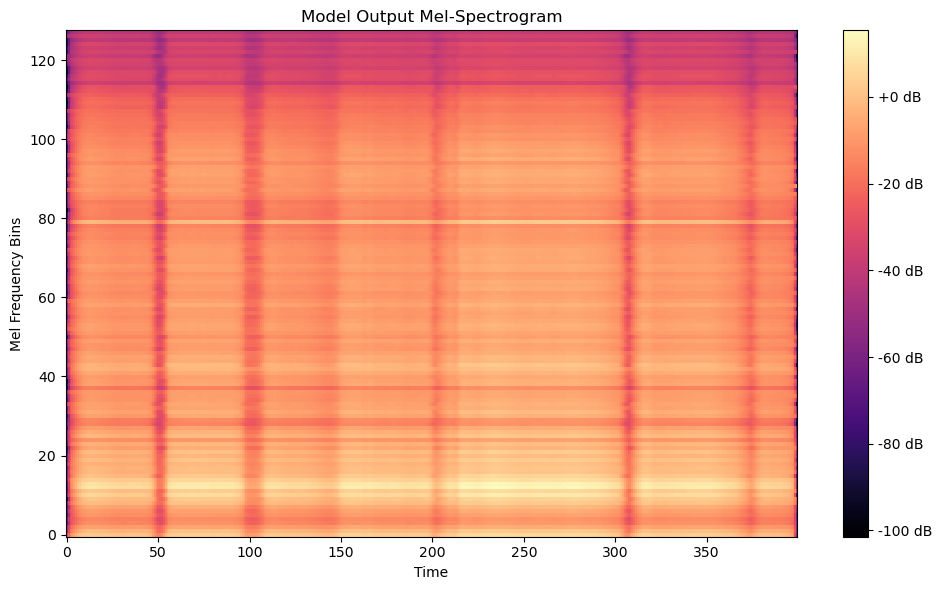

In [46]:
def plot_mel_spectrogram(mel_spectrogram, title="Mel-Spectrogram", save_path=None):
    """
    Plots a mel-spectrogram using matplotlib with shape checks and reshaping.

    Args:
        mel_spectrogram (torch.Tensor or np.ndarray): Mel-spectrogram to plot. 
            Shape should be [n_mels, timesteps], [1, n_mels, timesteps], or [1, n_mels, 1, timesteps].
        title (str): Title of the plot.
        save_path (str, optional): Path to save the plot. If None, the plot will be displayed.

    Raises:
        ValueError: If the mel-spectrogram shape is not compatible.
    """
    # Convert to numpy if it's a PyTorch tensor
    if isinstance(mel_spectrogram, torch.Tensor):
        mel_spectrogram = mel_spectrogram.cpu().numpy()
    
    # Handle possible shapes
    if len(mel_spectrogram.shape) == 4:  # [batch_size, n_mels, 1, timesteps]
        if mel_spectrogram.shape[2] != 1:
            raise ValueError(f"Invalid mel-spectrogram shape: {mel_spectrogram.shape}. Expected [batch_size, n_mels, 1, timesteps] where the third dimension is 1.")
        mel_spectrogram = mel_spectrogram.squeeze(2)  # Remove the singleton dimension
    if len(mel_spectrogram.shape) == 3:  # [batch_size, n_mels, timesteps]
        if mel_spectrogram.shape[0] != 1:
            raise ValueError(f"Expected batch size of 1, but got {mel_spectrogram.shape[0]}")
        mel_spectrogram = mel_spectrogram.squeeze(0)  # Remove batch dimension
    elif len(mel_spectrogram.shape) != 2:  # [n_mels, timesteps]
        raise ValueError(f"Invalid mel-spectrogram shape: {mel_spectrogram.shape}. Expected [n_mels, timesteps], [1, n_mels, timesteps], or [1, n_mels, 1, timesteps].")
    
    # Plot the mel-spectrogram
    plt.figure(figsize=(10, 6))
    plt.imshow(mel_spectrogram, aspect='auto', origin='lower', interpolation='nearest', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Mel Frequency Bins")
    plt.tight_layout()

    # Save or display the plot
    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved to {save_path}")
    else:
        plt.show()

# Example usage:
# Assume `output_mel` is your model's output with shape [1, n_mels, timesteps]
plot_mel_spectrogram(model_output, title="Model Output Mel-Spectrogram")

In [41]:
plot_mel_spectrogram(dataset[0]["control_mel"], title="Model Output Mel-Spectrogram")

ValueError: Expected batch size of 1, but got 128

In [45]:
dataset[0]["technique_mel"].shape

torch.Size([128, 1, 400])

In [43]:
model_output.shape

torch.Size([1, 128, 1, 400])

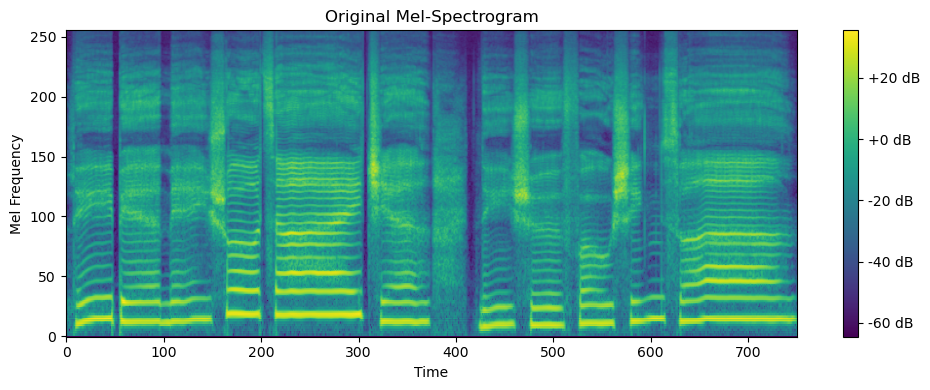

Applying augmentation: pitch_shift
in pitch_shift, -1 semi tone
Applying augmentation: time_stretch
in time_stretch_skimage_with_pitch_correction, 0.825 faster/slower


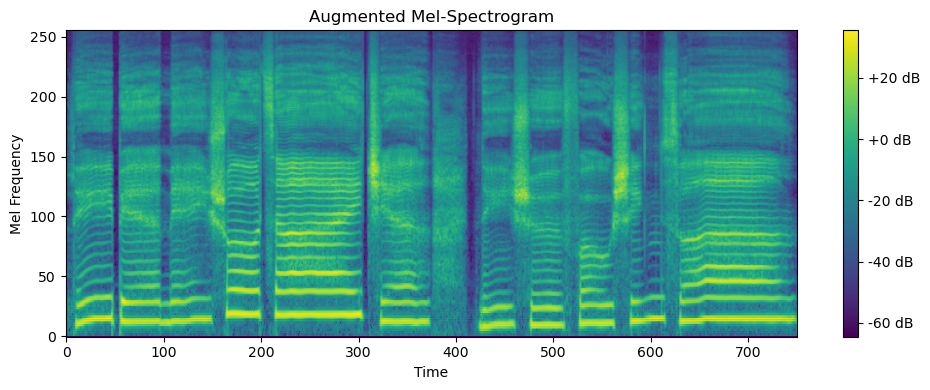

Augmented audio saved at: augmented_example.wav


In [150]:
import torchaudio
import torchaudio.transforms as T
import torchaudio.functional as F
import torch
import random
import os
import sys
import matplotlib.pyplot as plt
from skimage.transform import resize


os.environ["PYTHONIOENCODING"] = "utf-8"
# sys.stdout.reconfigure(encoding='utf-8')

# Define predefined sets
low_rates = [round(x, 3) for x in torch.arange(0.7, 0.925, 0.025).tolist()]  # [0.7, 0.725, ..., 0.9]
high_rates = [round(x, 3) for x in torch.arange(1.1, 1.325, 0.025).tolist()]  # [1.1, 1.125, ..., 1.3]
gain_values = [round(x, 2) for x in torch.arange(-10.0, 12.0, 2).tolist()]  # [-2, -1.75, ..., 1.75, 2]
time_mask_width_options = [500, 1000, 1500, 2000]
melbins_mask_width_options = [5,10,15]  # Mask width in frequency bins


def load_audio(file_path):
    
    waveform, sample_rate = torchaudio.load(file_path)
    
    return waveform, sample_rate

    
# Pitch Shift
def pitch_shift(waveform, sample_rate):
    
    if random.random() < 0.5:
        n_steps = random.randint(-6, -1)
    else:
        n_steps = random.randint(1, 6)

    print(f"in pitch_shift, {n_steps} semi tone")
    pitch_shifter = T.PitchShift(sample_rate=sample_rate, n_steps=n_steps)

    return pitch_shifter(waveform)

# Time Stretch
def time_stretch(waveform, sample_rate):
    
    n_fft = 256
    rate = random.uniform(0.8, 1.2)
    print(f"in time_stretch, {rate} faster/slower")

    spectrogram_transform = T.Spectrogram(n_fft=n_fft)
    spectrogram = spectrogram_transform(waveform)

    time_stretch_transform = T.TimeStretch(n_freq=(n_fft // 2) + 1)
    stretched_spectrogram = time_stretch_transform(spectrogram, rate)

    inverse_transform = T.InverseSpectrogram(n_fft=n_fft)
    return inverse_transform(stretched_spectrogram)

# Time Stretch with Skimage and Pitch Correction
def time_stretch_skimage_with_pitch_correction(waveform, sample_rate):
    
    if random.random() < 0.5:
        rate = random.choice([0.7, 0.75, 0.8, 0.85, 0.9])
    else:
        rate = random.choice([1.1, 1.15, 1.2, 1.25, 1.3])

    print(f"in time_stretch_skimage_with_pitch_correction, {rate} faster/slower")
    waveform_np = waveform.squeeze().numpy()
    original_length = len(waveform_np)
    new_length = int(original_length / rate)
    stretched_waveform_np = resize(waveform_np, (new_length,), preserve_range=True)

    stretched_waveform = torch.tensor(stretched_waveform_np, dtype=torch.float32).unsqueeze(0)

    semitones = -12 * torch.log2(torch.tensor(rate))
    pitch_shift_transform = T.PitchShift(sample_rate=sample_rate, n_steps=semitones.item())
    return pitch_shift_transform(stretched_waveform)

# Add Noise
def add_noise(waveform):
    
    noise_level = 0.01
    noise = torch.randn_like(waveform) * noise_level * waveform.abs().max()
    print(f"Added Gaussian noise with level {noise_level}")
    return waveform + noise

# Time Mask
def apply_time_mask(mel_spectrogram):
    
    n_mels, time_steps = mel_spectrogram.shape
    num_masks = random.randint(5, 15)
    
    for _ in range(num_masks):
        mask_width = random.choice(time_mask_width_options)
        mask_start = random.randint(0, time_steps - mask_width)
        print(f"Masking from {mask_start} to {mask_start + mask_width}")
        mel_spectrogram[:, mask_start:mask_start + mask_width] = -100.0
    return mel_spectrogram

# Frequency Filter
def frequency_filter(waveform, sample_rate):
    
    low_freq = 200
    high_freq = 2000
    central_freq = (low_freq + high_freq) / 2
    Q = 1.0
    return F.bandpass_biquad(waveform, sample_rate, central_freq, Q)  

def transform_to_mel_and_mask_bins(waveform, sample_rate, n_mels=256, augment_prob=0.5, f_min=72, f_max=None, hop_length=512, n_fft=2048):
    """
    Transform a waveform to a mel-spectrogram and optionally apply augmentation.
    
    Args:
        waveform (torch.Tensor): Input waveform (1D or 2D for mono).
        sample_rate (int): Sample rate of the waveform.
        n_mels (int): Number of mel bins for the mel-spectrogram.
        augment_prob (float): Probability of applying augmentation.
        f_min (float): Minimum frequency for the mel filter bank.
        f_max (float): Maximum frequency for the mel filter bank (default: Nyquist frequency).
        hop_length (int): Hop length for the STFT.
        n_fft (int): Number of FFT points for the STFT.
    
    Returns:
        torch.Tensor: Transformed mel-spectrogram (with or without augmentation).
    """
    # Ensure the waveform is 2D (batch, samples)
    if waveform.ndim == 1:
        waveform = waveform.unsqueeze(0)  # Add batch dimension

    # Transform waveform to mel-spectrogram
    mel_transform = T.MelSpectrogram(
        sample_rate=sample_rate, 
        n_mels=n_mels,
        f_min=f_min,
        f_max=f_max,
        hop_length=hop_length, 
        n_fft=n_fft
    )
    mel_spectrogram = mel_transform(waveform).squeeze(0)  # Remove batch dimension
    print(f"Mel-spectrogram shape: {mel_spectrogram.shape}")  # Debugging

    # Apply augmentation with `augment_prob`
    if augment_prob < 0.5:
        print("Applying augmentation: masking random mel bins")
        # Decide how many bins to mask (5 to 10)
        num_bins_to_mask = random.randint(10, 20)

        # Randomly select mel bins to mask
        for _ in range(num_bins_to_mask):
            # Randomly pick a mel bin to mask
            mel_bin = random.randint(0, n_mels - 1)
            mel_spectrogram[mel_bin, :] = 0.0  # Set the bin to zero
    else:
        print("No augmentation applied")

    return mel_spectrogram  

    
def plot_mel_spectrogram_new(mel_spectrogram, title="Mel-Spectrogram"):
    """
    Plot a mel-spectrogram in decibels (dB).

    Args:
        mel_spectrogram (torch.Tensor): The mel-spectrogram (shape: [n_mels, time_steps]).
        title (str): Title for the plot.

    Returns:
        None
    """
    # Ensure the mel-spectrogram is in the correct shape (remove batch dimension if present)
    if mel_spectrogram.ndim == 3:
        mel_spectrogram = mel_spectrogram.squeeze(0)

    # Convert to decibels (dB)
    amplitude_to_db = T.AmplitudeToDB(stype="power", top_db=100)  # Convert power to dB
    mel_spectrogram_db = amplitude_to_db(mel_spectrogram)

    # Convert to numpy for plotting
    mel_spectrogram_db = mel_spectrogram_db.numpy()

    # Plot the mel-spectrogram
    plt.figure(figsize=(10, 4))
    plt.imshow(mel_spectrogram_db, 
        aspect="auto", 
        origin="lower", 
        cmap="viridis"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Mel Frequency")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    
    file_path = os.path.join("Chinese", "ZH-Alto-1", "Breathy", "不再见", "Control_Group", "0000.wav")
    waveform, sample_rate = load_audio(file_path)
    
    # Transform waveform to mel-spectrogram
    mel_transform = T.MelSpectrogram(
        sample_rate=sample_rate, 
        n_mels=256, 
        f_min=72,
        hop_length=512, 
        n_fft=2048  # Adjust n_fft and hop_length for better resolution
    )
    original_mel_spectrogram = mel_transform(waveform)
    # Plot original mel-spectrogram
    plot_mel_spectrogram_new(original_mel_spectrogram, title="Original Mel-Spectrogram")
    
    if random.random() < 0.5:
        print("Applying augmentation: time_stretch")
        augmented_waveform = time_stretch_skimage_with_pitch_correction(waveform, sample_rate)
    
    if random.random() < 0.5:
        print("Applying augmentation: pitch_shift")
        augmented_waveform = pitch_shift(waveform, sample_rate)
    
    if random.random() < 0.5:
        print("Applying augmentation: frequency_filter")
        augmented_waveform = frequency_filter(waveform, sample_rate)
        
    if random.random() < 0.5:
        print("Applying augmentation: apply_time_mask")
        augmented_waveform = apply_time_mask(waveform)
    
    if random.random() < 0.5:
        print("Applying augmentation: transform_and_augment_waveform")
        result_mel_spectrogram = transform_to_mel_and_mask_bins(waveform, sample_rate)
    
    # Plot augmented mel-spectrogram
    plot_mel_spectrogram_new(result_mel_spectrogram, title="Augmented Mel-Spectrogram")

    # Save the augmented audio
    output_path = "augmented_example.wav"
    torchaudio.save(output_path, augmented_waveform, sample_rate)
    print(f"Augmented audio saved at: {output_path}")


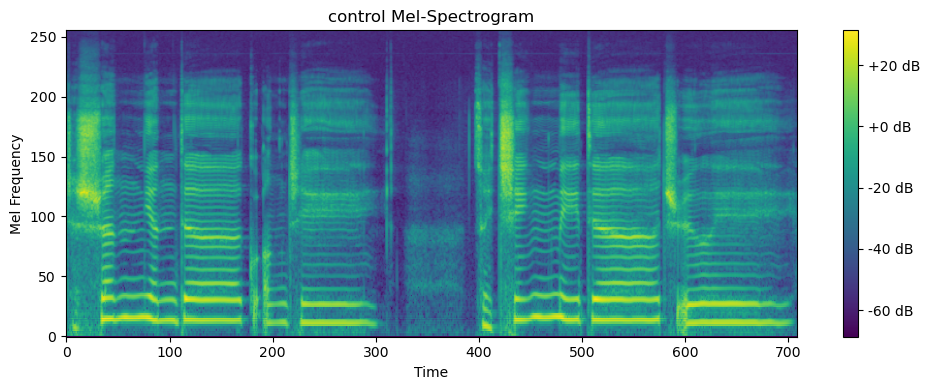

----------------------------------------------------


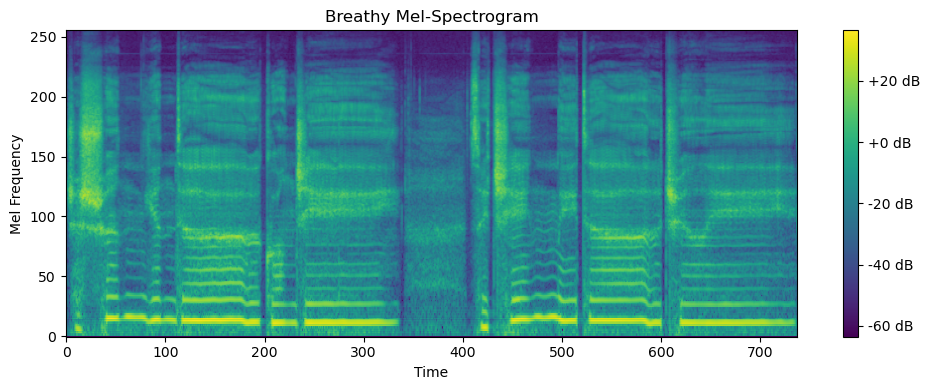

----------------------------------------------------
original_mel_spectrogram.shape: torch.Size([1, 256, 709])
new_mel_spectrogram.shape: torch.Size([1, 256, 709])


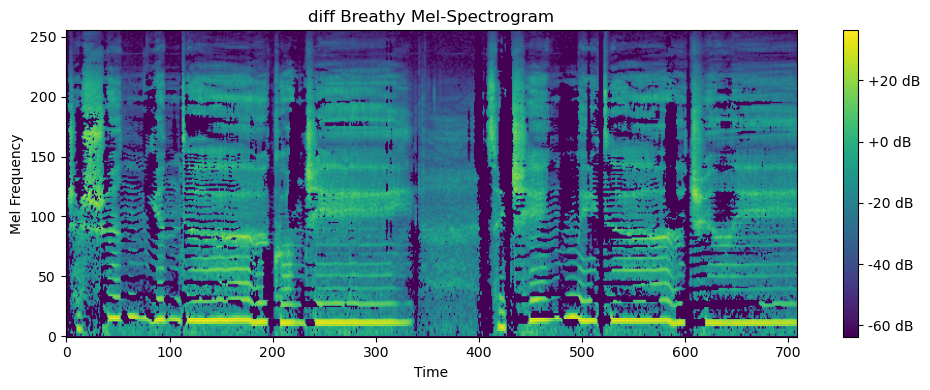

----------------------------------------------------
Input Pitch (F0): 242.42 Hz
Target Pitch (F0): 240.00 Hz
Pitch Shift: 0.17 semitones
original_mel_spectrogram.shape: torch.Size([1, 256, 709])
new_mel_spectrogram.shape: torch.Size([1, 256, 709])


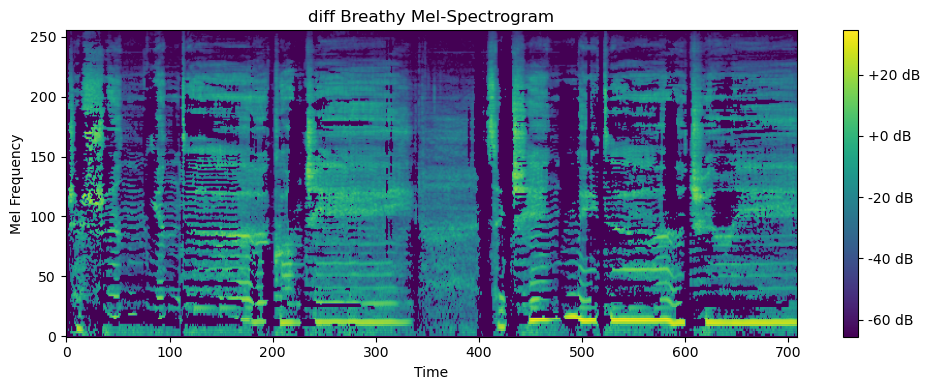

In [38]:
import torchaudio
import torchaudio.transforms as T
import torchaudio.functional as F
import torch
import random
import os
import sys
import matplotlib.pyplot as plt

def load_audio(file_path):
    
    waveform, sample_rate = torchaudio.load(file_path)
    
    return waveform, sample_rate

def plot_mel_spectrogram_new(mel_spectrogram, title="Mel-Spectrogram"):
    """
    Plot a mel-spectrogram in decibels (dB).

    Args:
        mel_spectrogram (torch.Tensor): The mel-spectrogram (shape: [n_mels, time_steps]).
        title (str): Title for the plot.

    Returns:
        None
    """
    # Ensure the mel-spectrogram is in the correct shape (remove batch dimension if present)
    if mel_spectrogram.ndim == 3:
        mel_spectrogram = mel_spectrogram.squeeze(0)

    # Convert to decibels (dB)
    amplitude_to_db = T.AmplitudeToDB(stype="power", top_db=100)  # Convert power to dB
    mel_spectrogram_db = amplitude_to_db(mel_spectrogram)

    # Convert to numpy for plotting
    mel_spectrogram_db = mel_spectrogram_db.numpy()

    # Plot the mel-spectrogram
    plt.figure(figsize=(10, 4))
    plt.imshow(mel_spectrogram_db, 
        aspect="auto", 
        origin="lower", 
        cmap="viridis"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Mel Frequency")
    plt.tight_layout()
    plt.show()

file_path = os.path.join("Chinese", "ZH-Alto-1", "Breathy", "水星记", "Control_Group", "0002.wav")
waveform_1, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
original_mel_spectrogram = mel_transform(waveform_1)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(original_mel_spectrogram, title="control Mel-Spectrogram")

print("----------------------------------------------------")

file_path = os.path.join("Chinese", "ZH-Alto-1", "Breathy", "水星记", "Breathy_Group", "0002.wav")
waveform_2, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
new_mel_spectrogram = mel_transform(waveform_2)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(new_mel_spectrogram, title="Breathy Mel-Spectrogram")

print("----------------------------------------------------")


# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram = new_mel_spectrogram[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram.shape: {new_mel_spectrogram.shape}")

diff_mel_spectrogram = new_mel_spectrogram - original_mel_spectrogram
# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram, title="diff Breathy Mel-Spectrogram")



print("----------------------------------------------------")

#--------------------------------------#
# pitch correct
waveform_2 = pitch_match_target_to_input(waveform_2, waveform_1, sample_rate)
new_mel_spectrogram = mel_transform(waveform_2)
#--------------------------------------#

# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram = new_mel_spectrogram[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram.shape: {new_mel_spectrogram.shape}")

diff_mel_spectrogram = new_mel_spectrogram - original_mel_spectrogram
# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram, title="diff Breathy Mel-Spectrogram")


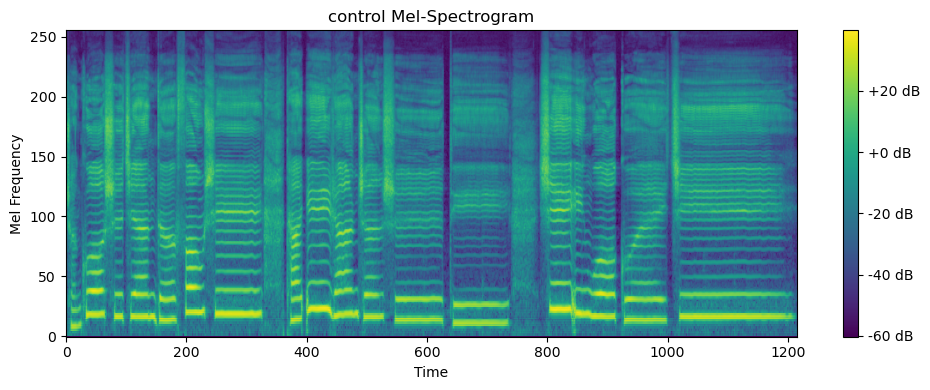

----------------------------------------------------


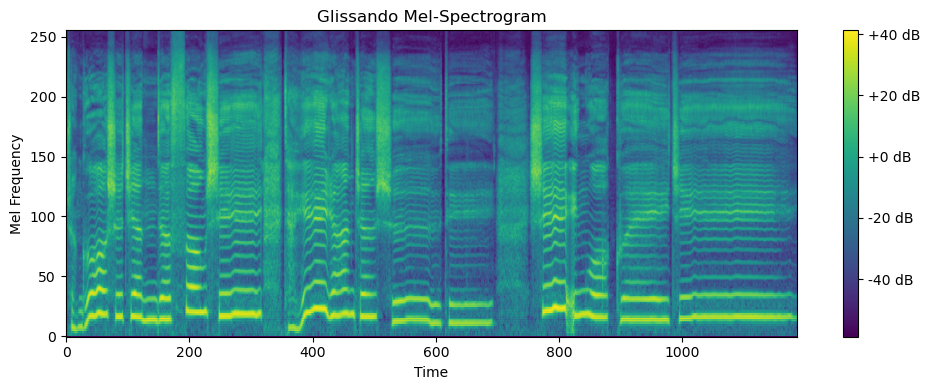

----------------------------------------------------
original_mel_spectrogram.shape: torch.Size([1, 256, 1187])
new_mel_spectrogram.shape: torch.Size([1, 256, 1187])


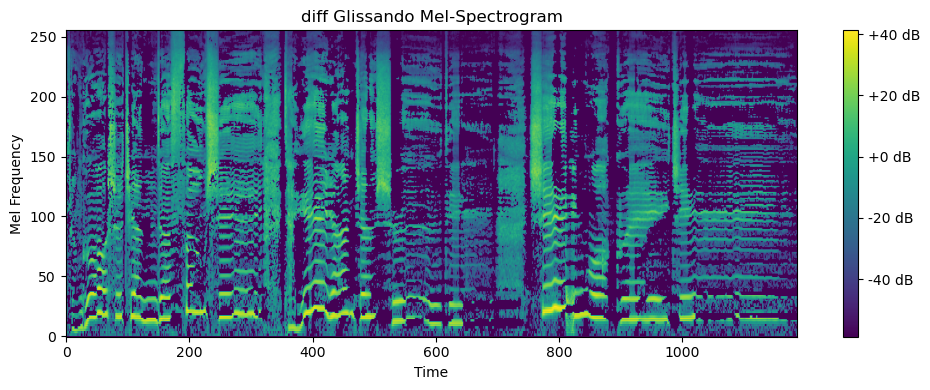

In [20]:
file_path = os.path.join("Chinese", "ZH-Alto-1", "Glissando", "水星记", "Control_Group", "0001.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
original_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(original_mel_spectrogram, title="control Mel-Spectrogram")

print("----------------------------------------------------")

file_path = os.path.join("Chinese", "ZH-Alto-1", "Glissando", "水星记", "Glissando_Group", "0001.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
new_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(new_mel_spectrogram, title="Glissando Mel-Spectrogram")

print("----------------------------------------------------")

# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram = new_mel_spectrogram[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram.shape: {new_mel_spectrogram.shape}")

diff_mel_spectrogram = new_mel_spectrogram - original_mel_spectrogram
# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram, title="diff Glissando Mel-Spectrogram")


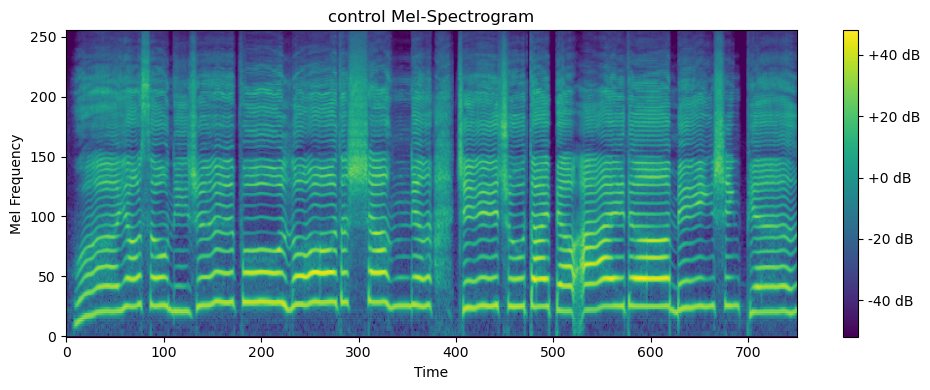

----------------------------------------------------


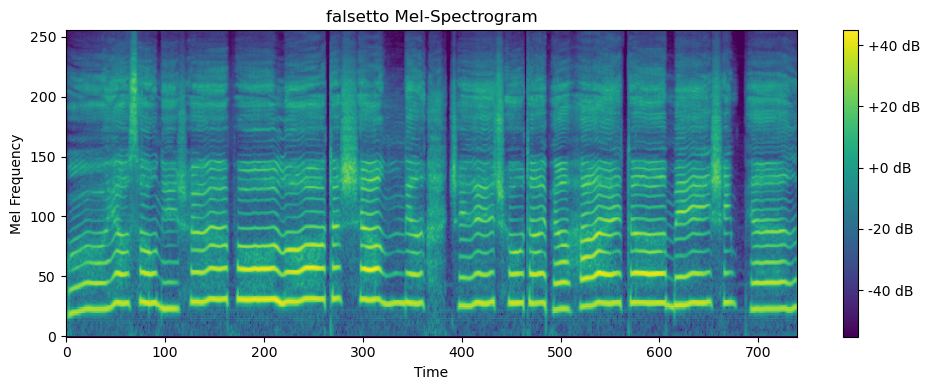

----------------------------------------------------
original_mel_spectrogram.shape: torch.Size([1, 256, 740])
new_mel_spectrogram_1.shape: torch.Size([1, 256, 740])


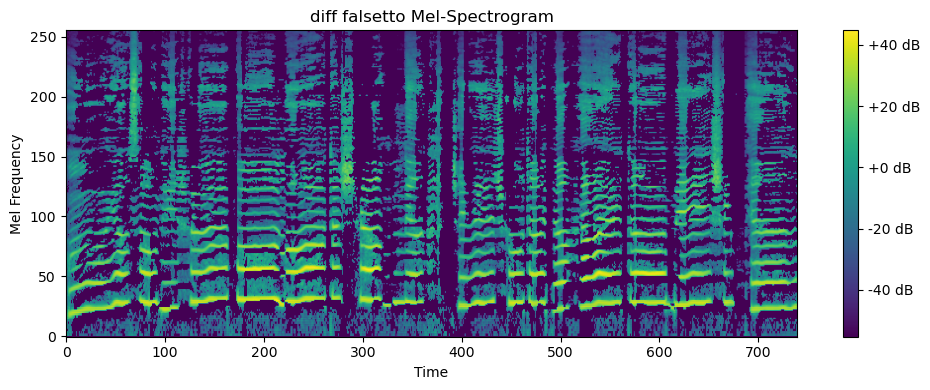

----------------------------------------------------


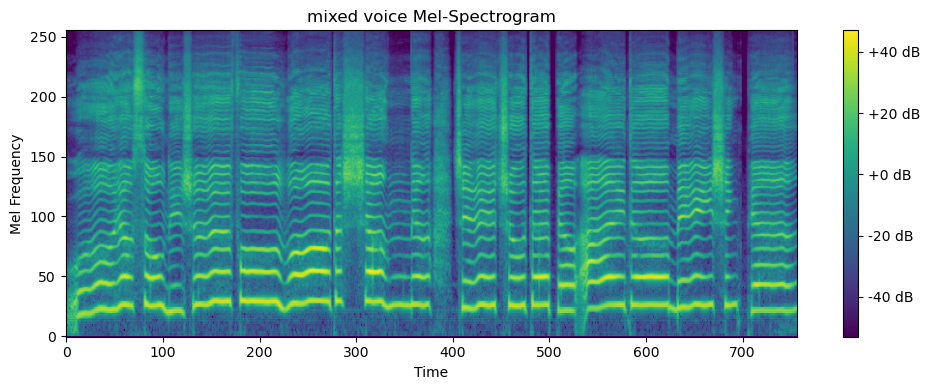

----------------------------------------------------
original_mel_spectrogram.shape: torch.Size([1, 256, 740])
new_mel_spectrogram_2.shape: torch.Size([1, 256, 740])


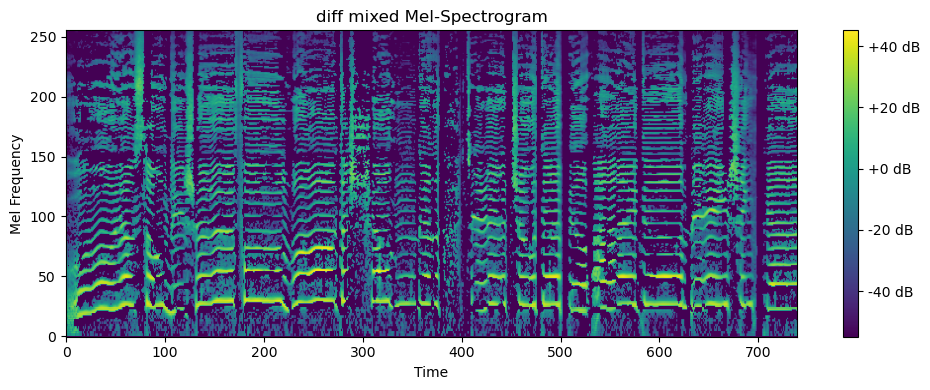

In [10]:
file_path = os.path.join("Chinese", "ZH-Alto-1", "Mixed_Voice_and_Falsetto", "日不落", "Control_Group", "0000.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
original_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(original_mel_spectrogram, title="control Mel-Spectrogram")

print("----------------------------------------------------")

file_path = os.path.join("Chinese", "ZH-Alto-1", "Mixed_Voice_and_Falsetto", "日不落", "Falsetto_Group", "0000.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
new_mel_spectrogram_1 = mel_transform(waveform)

plot_mel_spectrogram_new(new_mel_spectrogram_1, title="falsetto Mel-Spectrogram")

print("----------------------------------------------------")

# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram_1.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram_1 = new_mel_spectrogram_1[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram_1.shape: {new_mel_spectrogram_1.shape}")

diff_mel_spectrogram_1 = new_mel_spectrogram_1 - original_mel_spectrogram

# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram_1, title="diff falsetto Mel-Spectrogram")





print("----------------------------------------------------")

file_path = os.path.join("Chinese", "ZH-Alto-1", "Mixed_Voice_and_Falsetto", "日不落", "Mixed_Voice_Group", "0000.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
new_mel_spectrogram_2 = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(new_mel_spectrogram_2, title="mixed voice Mel-Spectrogram")

print("----------------------------------------------------")

# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram_2.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram_2 = new_mel_spectrogram_2[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram_2.shape: {new_mel_spectrogram_2.shape}")

diff_mel_spectrogram_2 = new_mel_spectrogram_2 - original_mel_spectrogram

# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram_2, title="diff mixed Mel-Spectrogram")

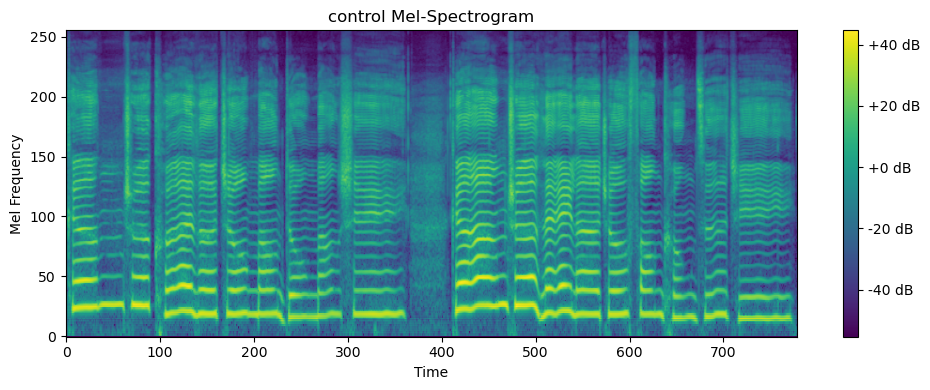

----------------------------------------------------


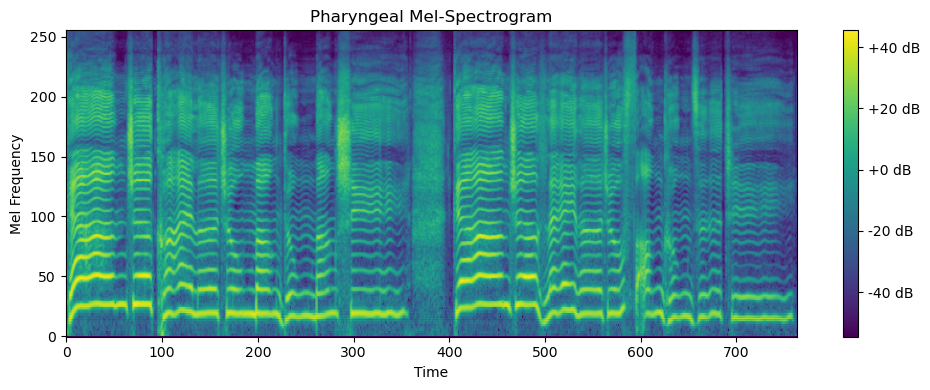

----------------------------------------------------
original_mel_spectrogram.shape: torch.Size([1, 256, 764])
new_mel_spectrogram.shape: torch.Size([1, 256, 764])


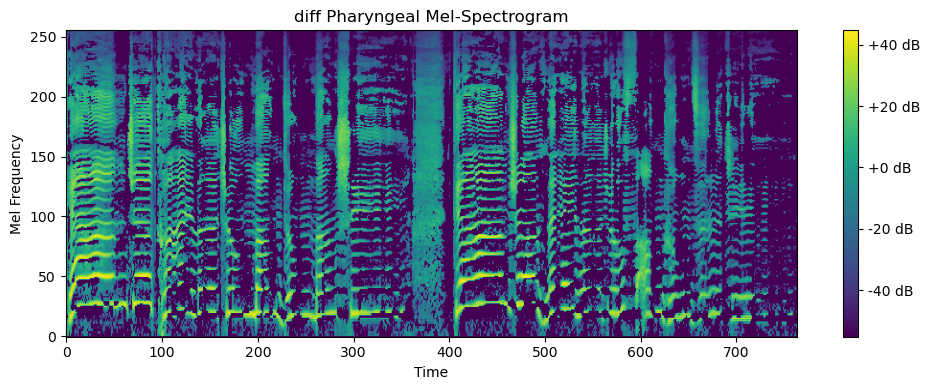

In [22]:
file_path = os.path.join("Chinese", "ZH-Alto-1", "Pharyngeal", "没那么简单", "Control_Group", "0000.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
original_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(original_mel_spectrogram, title="control Mel-Spectrogram")

print("----------------------------------------------------")

file_path = os.path.join("Chinese", "ZH-Alto-1", "Pharyngeal", "没那么简单", "Pharyngeal_Group", "0000.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
new_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(new_mel_spectrogram, title="Pharyngeal Mel-Spectrogram")

print("----------------------------------------------------")

# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram = new_mel_spectrogram[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram.shape: {new_mel_spectrogram.shape}")

diff_mel_spectrogram = new_mel_spectrogram - original_mel_spectrogram
# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram, title="diff Pharyngeal Mel-Spectrogram")

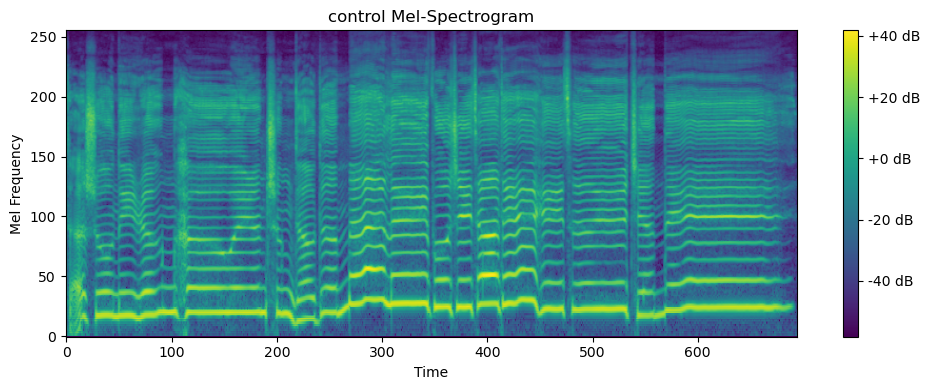

----------------------------------------------------


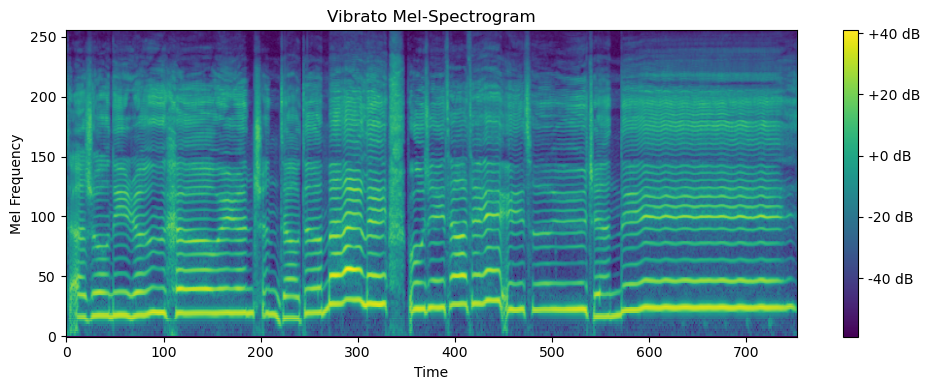

----------------------------------------------------
original_mel_spectrogram.shape: torch.Size([1, 256, 695])
new_mel_spectrogram.shape: torch.Size([1, 256, 695])


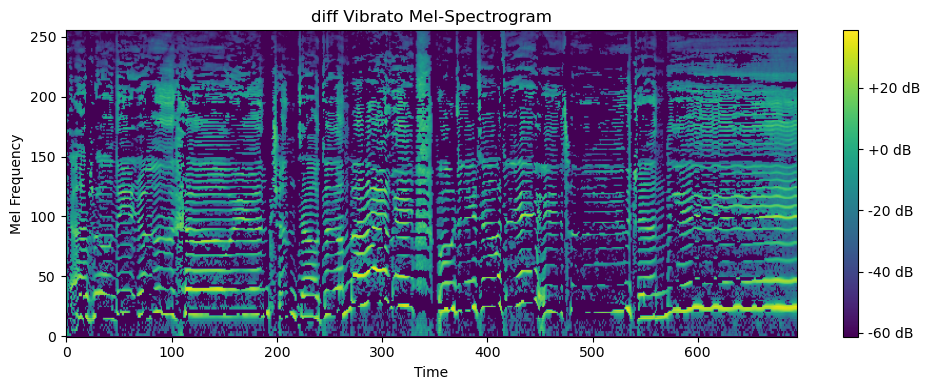

In [15]:
file_path = os.path.join("Chinese", "ZH-Alto-1", "Vibrato", "南山南", "Control_Group", "0004.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
original_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(original_mel_spectrogram, title="control Mel-Spectrogram")

print("----------------------------------------------------")

file_path = os.path.join("Chinese", "ZH-Alto-1", "Vibrato", "南山南", "Vibrato_Group", "0004.wav")
waveform, sample_rate = load_audio(file_path)
    
# Transform waveform to mel-spectrogram
mel_transform = T.MelSpectrogram(
    sample_rate=sample_rate, 
    n_mels=256, 
    f_min=72,
    hop_length=512, 
    n_fft=2048  # Adjust n_fft and hop_length for better resolution
)
new_mel_spectrogram = mel_transform(waveform)

# Plot original mel-spectrogram
plot_mel_spectrogram_new(new_mel_spectrogram, title="Vibrato Mel-Spectrogram")

print("----------------------------------------------------")

# Get the minimum length of time_steps between the two mel-spectrograms
min_time_steps = min(original_mel_spectrogram.size(2), new_mel_spectrogram.size(2))

# Truncate both mel-spectrograms along the time dimension
original_mel_spectrogram = original_mel_spectrogram[:, :, :min_time_steps]
new_mel_spectrogram = new_mel_spectrogram[:, :, :min_time_steps]

print(f"original_mel_spectrogram.shape: {original_mel_spectrogram.shape}")
print(f"new_mel_spectrogram.shape: {new_mel_spectrogram.shape}")

diff_mel_spectrogram = new_mel_spectrogram - original_mel_spectrogram
# Plot diff mel-spectrogram
plot_mel_spectrogram_new(diff_mel_spectrogram, title="diff Vibrato Mel-Spectrogram")

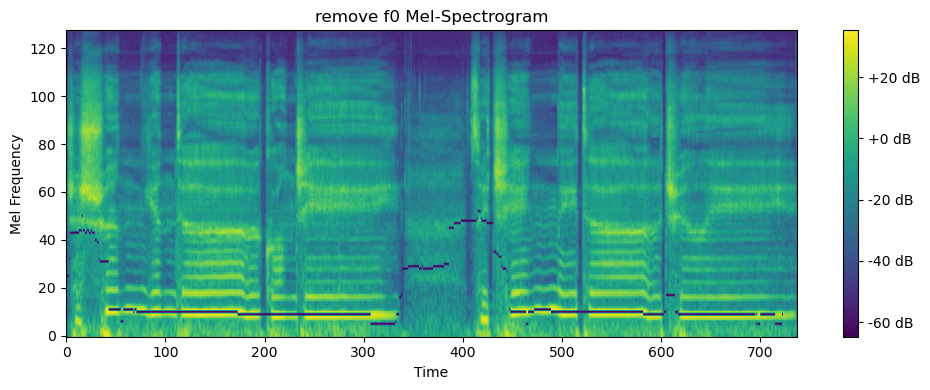

In [27]:
def remove_f0_torchaudio(waveform: torch.Tensor, sample_rate: int, n_fft: int = 2048, hop_length: int = 512, n_mels: int = 128):
    """
    Remove the fundamental frequency (F0) from a waveform using mel-spectrogram processing.

    Args:
        waveform (torch.Tensor): Input waveform tensor (1D or 2D).
        sample_rate (int): Sampling rate of the audio.
        n_fft (int): Number of FFT components.
        hop_length (int): Hop length for FFT.
        n_mels (int): Number of mel bins.

    Returns:
        torch.Tensor: Mel-spectrogram with F0 removed.
    """

    # Ensure waveform is 2D [channels, time]
    if waveform.dim() == 1:
        waveform = waveform.unsqueeze(0)

    # Step 1: Extract Mel-Spectrogram
    mel_spectrogram_transform = T.MelSpectrogram(
        sample_rate=sample_rate, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels, power=2.0
    )
    mel_spectrogram = mel_spectrogram_transform(waveform)

    # Step 2: Detect F0 using torchaudio's pitch detection
    pitch = torchaudio.functional.detect_pitch_frequency(waveform, sample_rate, frame_time=hop_length / sample_rate)

    # Step 3: Convert F0 to mel bins
    def hz_to_mel_bin(frequencies, n_mels, sample_rate):
        mel_frequencies = 2595 * torch.log10(1 + frequencies / 700)  # Hz to mel scale
        mel_max = 2595 * torch.log10(torch.tensor(1 + (sample_rate / 2) / 700))  # Nyquist freq as tensor
        mel_bins = (mel_frequencies / mel_max * n_mels).long()
        return torch.clamp(mel_bins, 0, n_mels - 1)  # Ensure bins are within valid range

    # Step 4: Suppress F0 bins in the mel-spectrogram
    filtered_mel = mel_spectrogram.clone()

    # Iterate over time steps and mask F0 bins
    for t in range(pitch.shape[1]):  # Iterate over time frames
        f0 = pitch[0, t]  # Extract single F0 value
        if f0 > 0:  # Ignore unvoiced frames (F0 = 0)
            mel_bin = hz_to_mel_bin(f0, n_mels, sample_rate).item()
            filtered_mel[:, mel_bin, t] = 0  # Zero out the F0 mel bin dynamically

    return filtered_mel



# Example Usage
if __name__ == "__main__":
    
    
    file_path = os.path.join("Chinese", "ZH-Alto-1", "Breathy", "水星记", "Breathy_Group", "0002.wav")
    waveform, sample_rate = load_audio(file_path)

    # Remove F0 and get the mel-spectrogram
    f0_removed_mel_spectrogram = remove_f0_torchaudio(waveform, sample_rate)

    plot_mel_spectrogram_new(f0_removed_mel_spectrogram, title="remove f0 Mel-Spectrogram")

In [33]:
def pitch_match_target_to_input(waveform_target: torch.Tensor, waveform_input: torch.Tensor, sample_rate: int):
    """
    Align the pitch of the target waveform to match the input waveform using torchaudio's pitch shifting.

    Args:
        waveform_target (torch.Tensor): Target waveform tensor [1, time].
        waveform_input (torch.Tensor): Input waveform tensor [1, time].
        sample_rate (int): Sampling rate of the audio.

    Returns:
        torch.Tensor: Pitch-shifted target waveform.
    """
    # Ensure mono audio for simplicity
    if waveform_input.dim() > 1 and waveform_input.shape[0] > 1:
        waveform_input = torch.mean(waveform_input, dim=0, keepdim=True)
    if waveform_target.dim() > 1 and waveform_target.shape[0] > 1:
        waveform_target = torch.mean(waveform_target, dim=0, keepdim=True)

    # Step 1: Detect fundamental frequency (F0) for input and target
    def detect_f0(waveform, sample_rate):
        pitch = F.detect_pitch_frequency(waveform, sample_rate, frame_time=0.032)
        valid_pitch = pitch[pitch > 0]  # Ignore unvoiced frames
        if len(valid_pitch) > 0:
            return torch.median(valid_pitch).item()  # Median pitch
        else:
            return 0  # No pitch detected
    
    input_f0 = detect_f0(waveform_input, sample_rate)
    target_f0 = detect_f0(waveform_target, sample_rate)

    print(f"Input Pitch (F0): {input_f0:.2f} Hz")
    print(f"Target Pitch (F0): {target_f0:.2f} Hz")

    # Step 2: Calculate pitch shift in semitones (target -> input)
    if input_f0 > 0 and target_f0 > 0:
        pitch_shift_semitones = 12 * torch.log2(torch.tensor(input_f0 / target_f0)).item()
        print(f"Pitch Shift: {pitch_shift_semitones:.2f} semitones")
    else:
        print("Pitch could not be detected for input or target.")
        return waveform_target  # Return the original target waveform if pitch can't be detected

    # Step 3: Apply pitch shift to target waveform
    shifted_target_waveform = F.pitch_shift(waveform_target, sample_rate=sample_rate, n_steps=pitch_shift_semitones)

    return shifted_target_waveform

# Example Usage
if __name__ == "__main__":
    
    
    file_path_1 = os.path.join("Chinese", "ZH-Alto-1", "Mixed_Voice_and_Falsetto", "日不落", "Control_Group", "0000.wav")
    waveform_1, sample_rate = load_audio(file_path_1)
    
    file_path_2 = os.path.join("Chinese", "ZH-Alto-1", "Mixed_Voice_and_Falsetto", "日不落", "Falsetto_Group", "0000.wav")
    waveform_2, sample_rate = load_audio(file_path_2)

    # Align pitch
    aligned_waveform = pitch_align_torchaudio(waveform_2, waveform_1, sample_rate)

    # Save pitch-aligned audio
    torchaudio.save("aligned_input.wav", aligned_waveform, sample_rate)
    print("Pitch-aligned audio saved successfully!")

Input Pitch (F0): 436.36 Hz
Target Pitch (F0): 396.69 Hz
Pitch Shift: -1.65 semitones
Pitch-aligned audio saved successfully!
